**MIT License** 

Copyright (c) 2022 Tanvi Manohar Valkunde

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE

**Abstract**

The dataset is of Ames Housing. The target is to find the Sales price with rest features available.

**Aim:** 

In this assignment we aim to interpret the results of

 1.Linear Model

 2.Tree Based Model 
 
 3.Best model of AutoML H2O
 
Using different Model Interpretibility Methods.

In this excercise I have used

 1.SHAP analysis

 2.LIME analysis 

 3.Partial Dependence Plot Analysis

In [60]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install h2o
!pip install sklearn>=0.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [61]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [62]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV


In [63]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [64]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [65]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

4


In [66]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:52977..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp9iluac75
  JVM stdout: /tmp/tmp9iluac75/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp9iluac75/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:52977
Connecting to H2O server at http://127.0.0.1:52977 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_bdc9h5
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,4 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [67]:
ames_df = pd.read_csv(
    "https://raw.githubusercontent.com/Tanvivalkunde/dsem-ass-2/main/ames%20housing.csv"
)  # Reading CSV file into Pandas DataFrame"

In [68]:
X = ames_df.drop(['SalePrice','Street','Year_Built','Yr_Sold','Mo_Sold'], axis=1) # Training Feature
Y = ames_df['SalePrice']  # Target

In [69]:
from sklearn.model_selection import train_test_split
!pip install shap
import shap

(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Fitting a Linear Model**

In [70]:
!pip install sklearn
import sklearn

from sklearn import linear_model
linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model
     

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


LinearRegression()

In [71]:
dfpd=pd.read_csv("https://raw.githubusercontent.com/Tanvivalkunde/dsem-ass-2/main/ames%20housing.csv")

In [72]:
import statsmodels.formula.api as smf #OLS model Library
results = smf.ols('SalePrice ~ MS_SubClass + Lot_Frontage + Lot_Area + Bldg_Type + Year_Built + House_Style + Overall_Qual +Overall_Cond + Gr_Liv_Area +Full_Bath + Half_Bath +Bedroom_AbvGr +Kitchen_AbvGr+ TotRms_AbvGrd +Fireplaces+ Garage_Area +Mo_Sold + Yr_Sold + Street' , data=dfpd).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.786
Model:                            OLS   Adj. R-squared:                  0.783
Method:                 Least Squares   F-statistic:                     257.5
Date:                Thu, 30 Mar 2023   Prob (F-statistic):               0.00
Time:                        03:17:14   Log-Likelihood:                -16272.
No. Observations:                1351   AIC:                         3.258e+04
Df Residuals:                    1331   BIC:                         3.269e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -1.391e+06   1.78e+06     -0.780      0.436   -4.89e+06    2.11e+06
Street[T.Pave]  5448.6768   2.44e+04      0.224      0.823   -4.24e+04    5.33e+04
MS_SubClass      -59.8839     87.620     -0.683      0.494    -231.773     112.005
Lot_Frontage    -194.0745     64.262     -3.020      0.003    -320.140     -68.009
Lot_Area           0.5046      0.172      2.929      0.003       0.167       0.843
Bldg_Type      -2431.8617   2543.288     -0.956      0.339   -7421.152    2557.429
Year_Built       453.1218    127.336      3.558      0.000     203.321     702.922
House_Style      -3.3e+04   5721.293     -5.767      0.000   -4.42e+04   -2.18e+04
Overall_Qual    2.575e+04   1594.156     16.152      0.000    2.26e+04    2.89e+04
Overall_Cond    6058.0928   1828.967      3.312      0.001    2470.122    9646.064
Gr_Liv_Area       71.7027      5.500     13.037      0.000      60.913      82.493
Full_Bath      -3527.9032   3854.867     -0.915      0.360   -1.11e+04    4034.374
Half_Bath       8737.2993   3848.740      2.270      0.023    1187.042    1.63e+04
Bedroom_AbvGr  -2444.3815   2502.442     -0.977      0.329   -7353.542    2464.779
Kitchen_AbvGr  -3.181e+04   9511.982     -3.344      0.001   -5.05e+04   -1.31e+04
TotRms_AbvGrd   2487.0371   1551.815      1.603      0.109    -557.233    5531.308
Fireplaces      1.007e+04   2324.070      4.334      0.000    5513.175    1.46e+04
Garage_Area       69.6240      9.401      7.406      0.000      51.181      88.067
Mo_Sold         -143.5866    418.290     -0.343      0.731    -964.165     676.992
Yr_Sold          209.2443    877.939      0.238      0.812   -1513.050    1931.539
==============================================================================
Omnibus:                      797.719   Durbin-Watson:                   1.775
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            73485.489
Skew:                          -1.849   Prob(JB):                         0.00
Kurtosis:                      38.941   Cond. No.                     2.05e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.05e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**Ordinary least squares (OLS) regression**
The relationship between one or more independent variables and a dependent variable is estimated using the ordinary least squares (OLS) regression statistical method of analysis, which minimizes the sum of the squares in the difference between the observed and predicted values of the dependent variable

Here are some conclusions that can be drawn from the regression results:

The output shows the results of a multiple linear regression analysis of the SalePrice of 1351 homes based on 19 predictor variables. The model has an R-squared value of 0.786, indicating that approximately 78.6% of the variability in SalePrice can be explained by the predictor variables.

The coefficient estimates for each predictor variable and the intercept are shown in the "coef" column. A positive coefficient indicates a positive association between the predictor variable and SalePrice, while a negative coefficient indicates a negative association. The "std err" column shows the standard error of the coefficient estimates, and the "t" column shows the t-value for the hypothesis test that the coefficient is equal to zero. The "P>|t|" column shows the p-value for this test, indicating the strength of evidence against the null hypothesis that the coefficient is equal to zero. A p-value less than 0.05 suggests that the variable is statistically significant in predicting SalePrice.

Based on the output, some variables appear to have a statistically significant association with SalePrice, including Lot_Frontage, Lot_Area, Year_Built, House_Style, Overall_Qual, Overall_Cond, Gr_Liv_Area, Half_Bath, Kitchen_AbvGr, Fireplaces, and Garage_Area.

However, some variables such as Street, MS_SubClass, Bldg_Type, Full_Bath, Bedroom_AbvGr, TotRms_AbvGrd, Mo_Sold, and Yr_Sold do not seem to have a statistically significant association with SalePrice, as indicated by their high p-values.

The Durbin-Watson value of 1.775 suggests that there is no significant autocorrelation among the residuals, and the Omnibus test indicates that the residuals are not normally distributed. The skewness and kurtosis values also suggest that the residuals are not normally distributed.

Overall, the regression model appears to have some significant predictor variables, but the distribution of the residuals may suggest some limitations to the model's predictive ability

**Fit Tree Based Model**

In [73]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

In [74]:
import matplotlib.pyplot as plt
from sklearn.tree import export_graphviz

# Visualization of Nodes for the purpose of explainability
plt.figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=x_train.columns,
    filled=True,
    precision=2,
    rounded=True,
)


<Figure size 2560x1920 with 0 Axes>

In [75]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Users/Tanvi/Downloads/windows_10_msbuild_Release_graphviz-7.1.0-win32.zip/Graphviz'

In [76]:
!pip install pydot Graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [77]:
import pydot

In [78]:
import pydot
import matplotlib.image as mpimg
import matplotlib.pyplot as plt


plt.figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=X.columns,
    filled=True,
    rounded=True
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")


<Figure size 2560x1920 with 0 Axes>

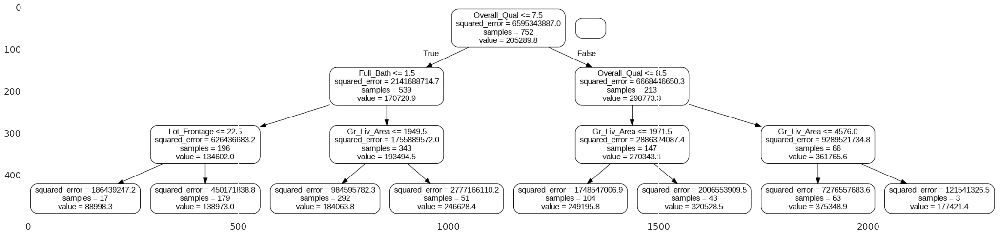

In [79]:
# Visualization of Nodes for the purpose of explainability
plt.figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

**Interpreting Nodes of a Tree-Based Model**
Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

From the above graph we can see that the decision tree makes the best decision by trying various combinations itself and tells us that Overall_Qual is the important feature

In [80]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [81]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: Overall_Qual         Importance: 0.8
Variable: Gr_Liv_Area          Importance: 0.16
Variable: Full_Bath            Importance: 0.02
Variable: Overall_Cond         Importance: 0.01
Variable: Bedroom_AbvGr        Importance: 0.01
Variable: PID                  Importance: 0.0
Variable: MS_SubClass          Importance: 0.0
Variable: Lot_Frontage         Importance: 0.0
Variable: Lot_Area             Importance: 0.0
Variable: Bldg_Type            Importance: 0.0
Variable: House_Style          Importance: 0.0
Variable: Half_Bath            Importance: 0.0
Variable: Kitchen_AbvGr        Importance: 0.0
Variable: TotRms_AbvGrd        Importance: 0.0
Variable: Fireplaces           Importance: 0.0
Variable: Garage_Area          Importance: 0.0


The variable importance we get from the tree-based regressor re-inforces our interpretation from the linear model.

**Getting best model using H2O AutoML**

In [82]:
ames_hf = h2o.H2OFrame(ames_df)  # Converting Pandas dataframe in H2O dataframe

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [83]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = ames_hf.split_frame([pct_rows])

In [84]:
# Setting up AutoML
def autoML(df_train, df_test):
    X = df_train.columns
    y = "SalePrice"

    X.remove(y)  # Removing the result frm our predictors data
    X.remove("Street")  # Removing ID from the predictor's data, as it is not related

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml

    # Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [85]:
autoML = autoML(df_train, df_test)  # Training AutoML

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


In [86]:
autoML[2].leaderboard  # Leaderbord of AutoML output

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_3_AutoML_1_20230330_31724,28116.7,7.90547e+08,18671.3,0.115031,7.90547e+08
StackedEnsemble_AllModels_1_AutoML_1_20230330_31724,28275.7,7.99513e+08,18733.1,0.114988,7.99513e+08
StackedEnsemble_BestOfFamily_2_AutoML_1_20230330_31724,28316.5,8.01822e+08,18775,0.115673,8.01822e+08
StackedEnsemble_BestOfFamily_4_AutoML_1_20230330_31724,28319.3,8.01981e+08,18965,0.115706,8.01981e+08
StackedEnsemble_AllModels_2_AutoML_1_20230330_31724,28357.8,8.04165e+08,18782.1,0.115195,8.04165e+08
GBM_grid_1_AutoML_1_20230330_31724_model_23,28720.4,8.24861e+08,19120.9,0.11685,8.24861e+08
GBM_grid_1_AutoML_1_20230330_31724_model_9,28738.2,8.25882e+08,19019.9,0.118732,8.25882e+08
GBM_grid_1_AutoML_1_20230330_31724_model_7,28946.2,8.37883e+08,19826.6,0.121873,8.37883e+08
GBM_2_AutoML_1_20230330_31724,29012.9,8.41748e+08,18974,0.118042,8.41748e+08
GBM_grid_1_AutoML_1_20230330_31724_model_8,29035.2,8.43043e+08,19380.5,0.118317,8.43043e+08


In [87]:
autoML_model = getBestModel(autoML[2])  # Getting Best Model
print(autoML_model)


5
Model Details
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_1_AutoML_1_20230330_31724_model_23


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    58                 58                          46231                  10           13           12.2931       28            70            58.3793

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 202695411.44626904
RMSE: 14237.113873474113
MAE: 9193.208757102273
RMSLE: 0.06066874210157451
Mean Residual Deviance: 202695411.44626904

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 824860709.8515818
RMSE: 28720.388400082298
MAE: 19120.869285528475
RMSLE: 0.11684968587113816
Mean Residual Deviance

**SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model**

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

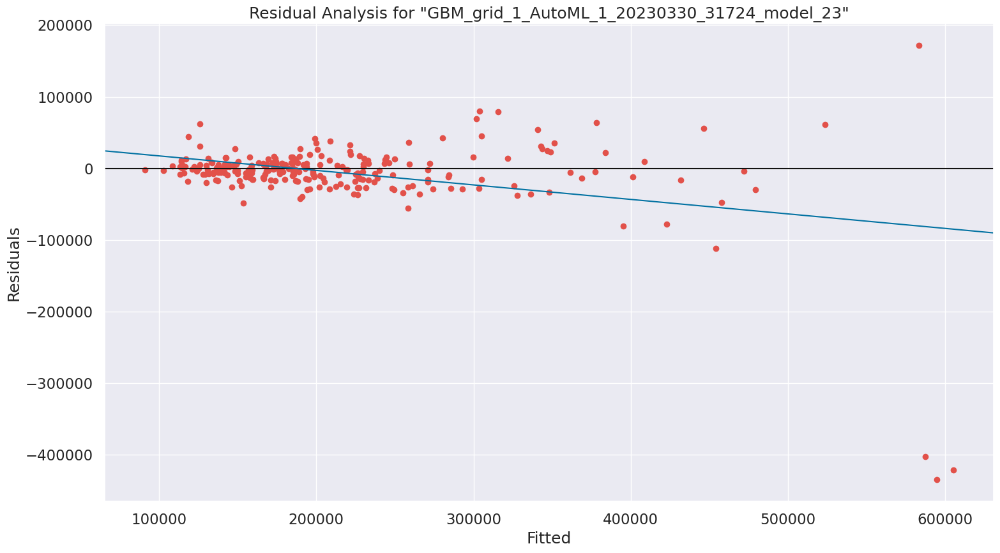

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

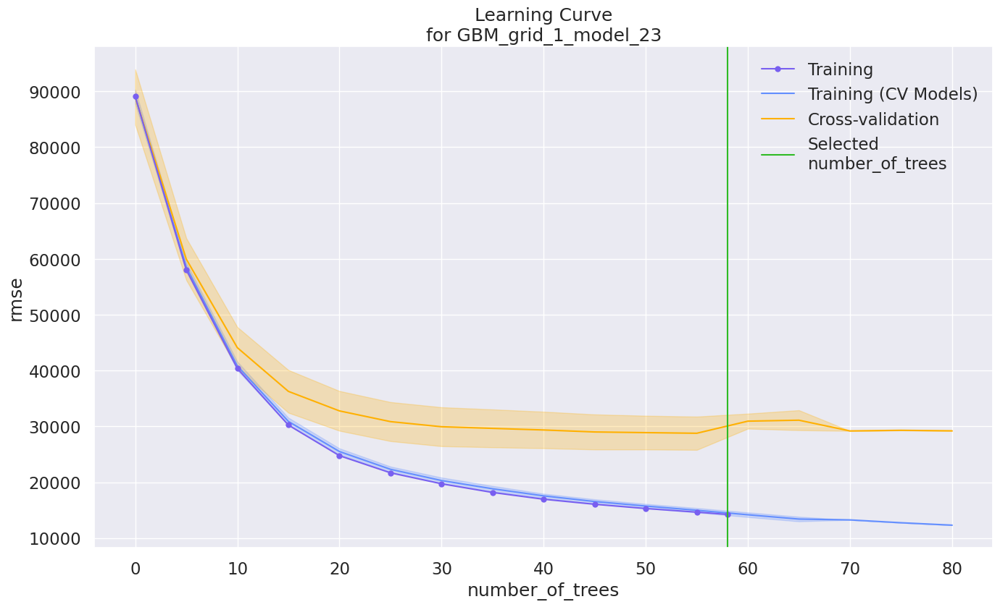

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

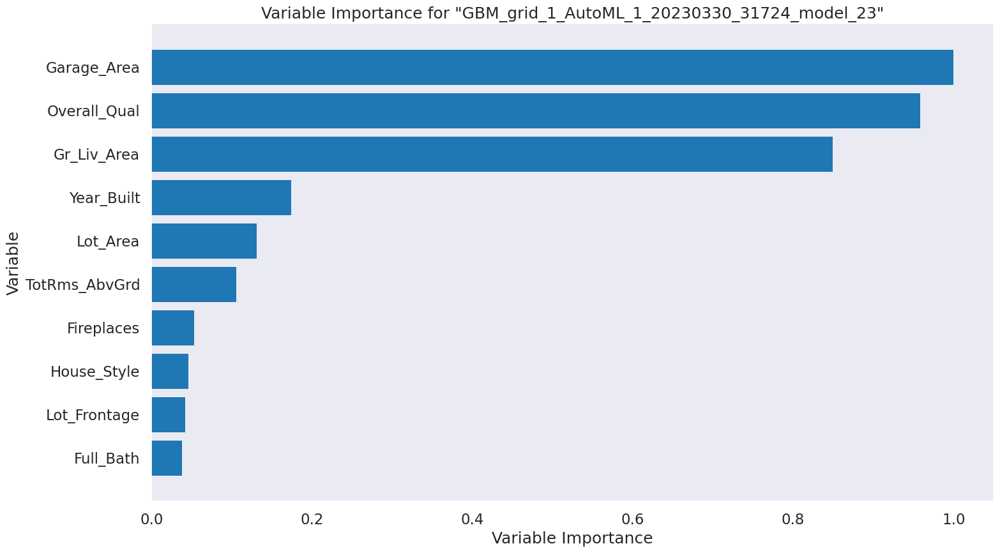

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

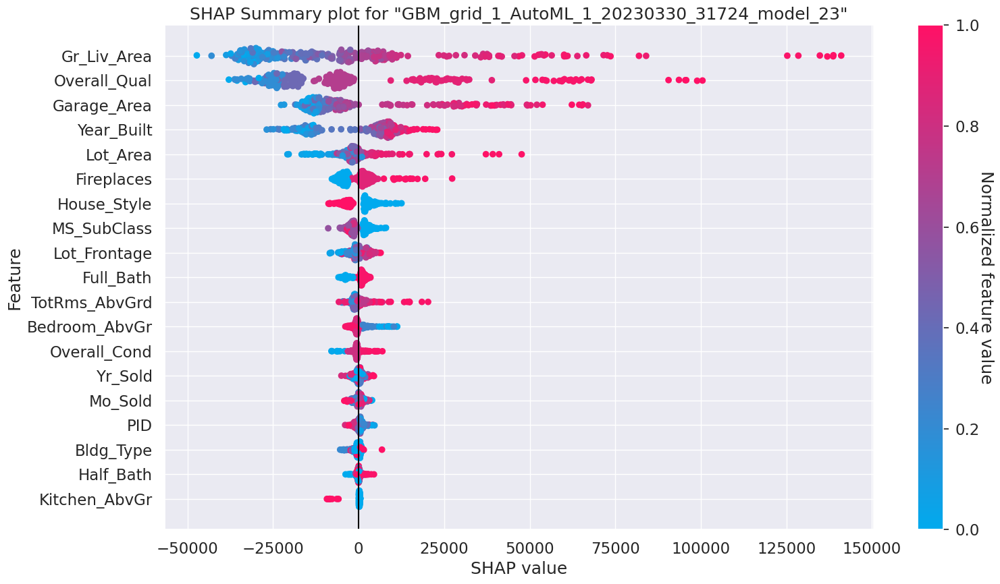

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

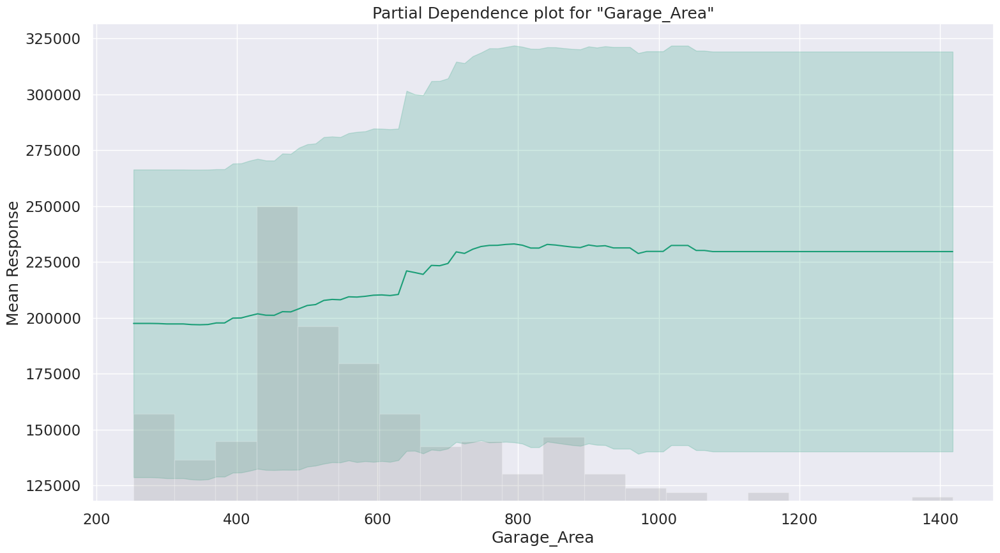

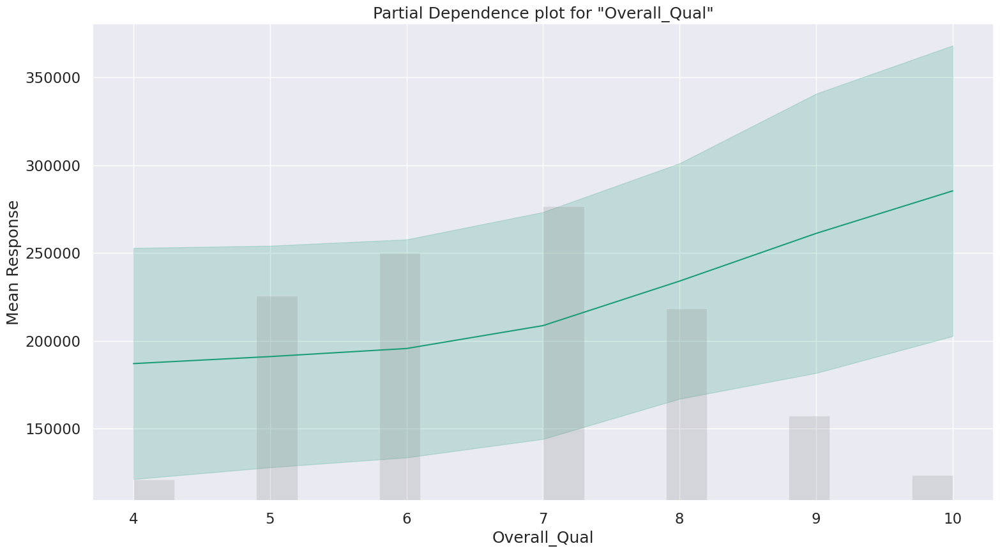

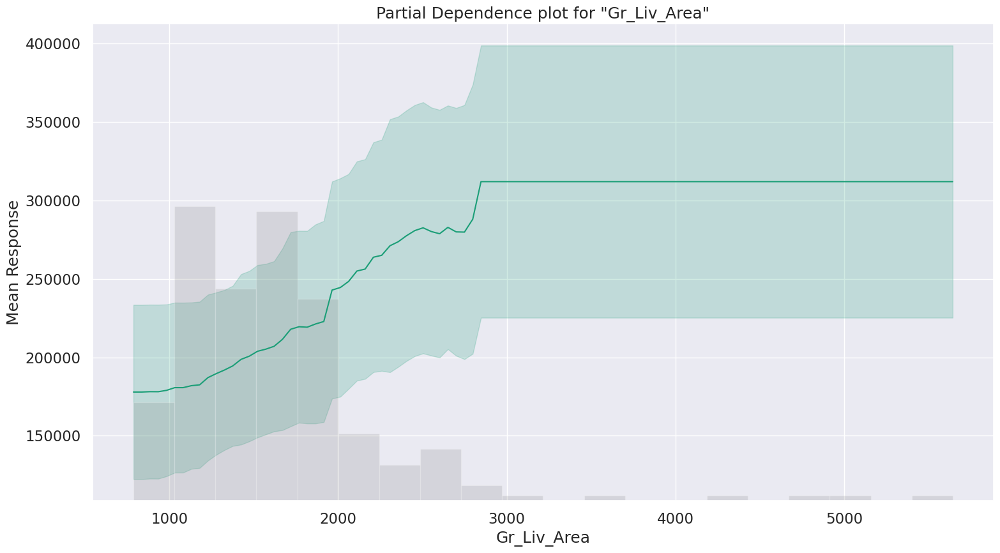

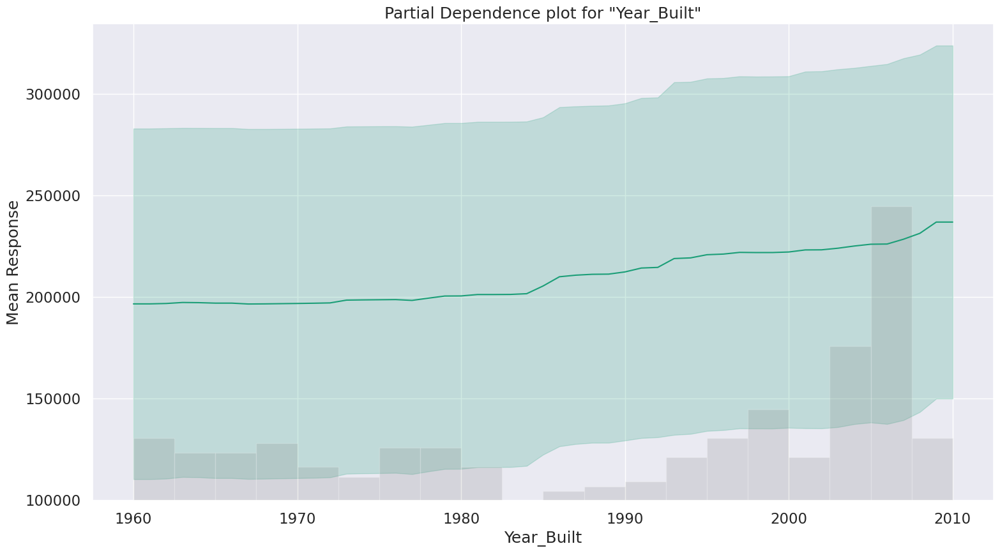

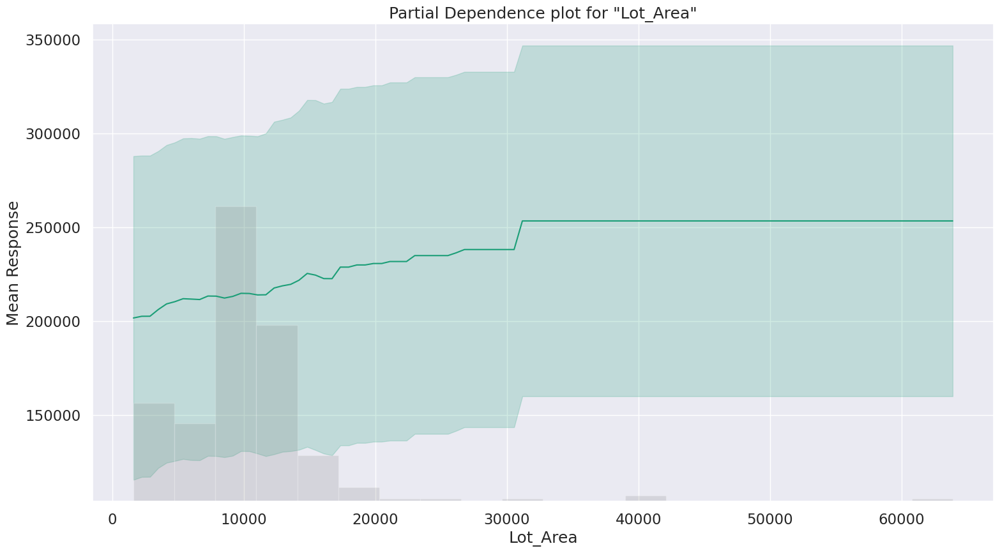

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

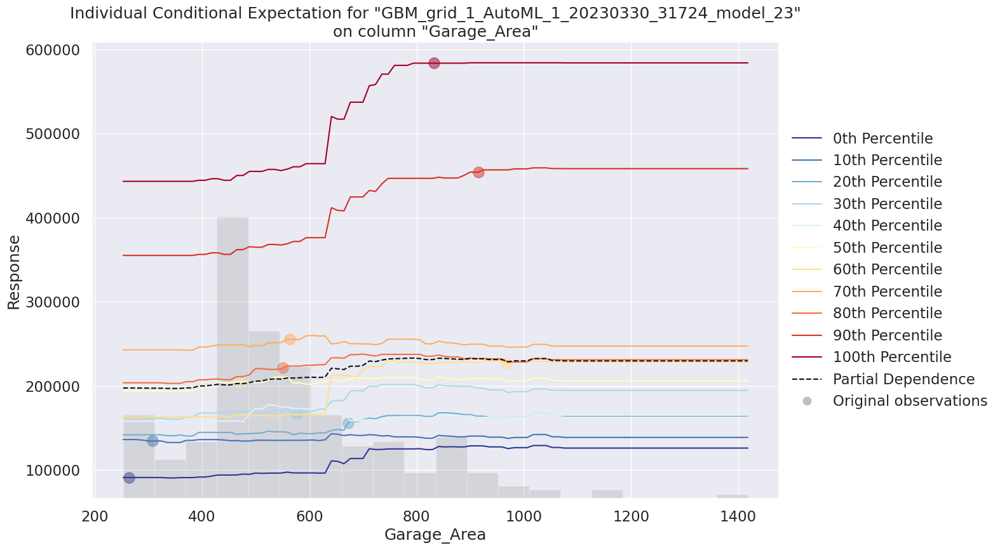

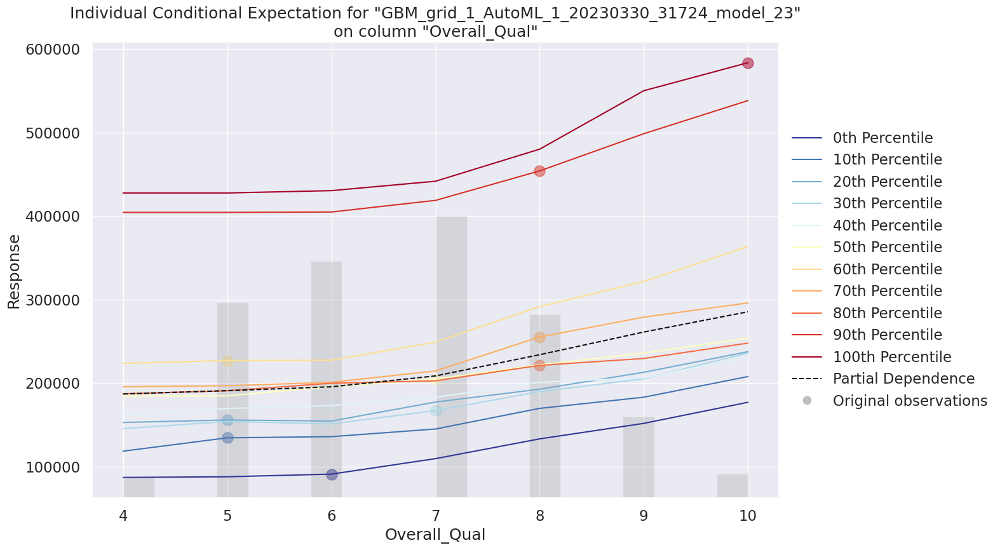

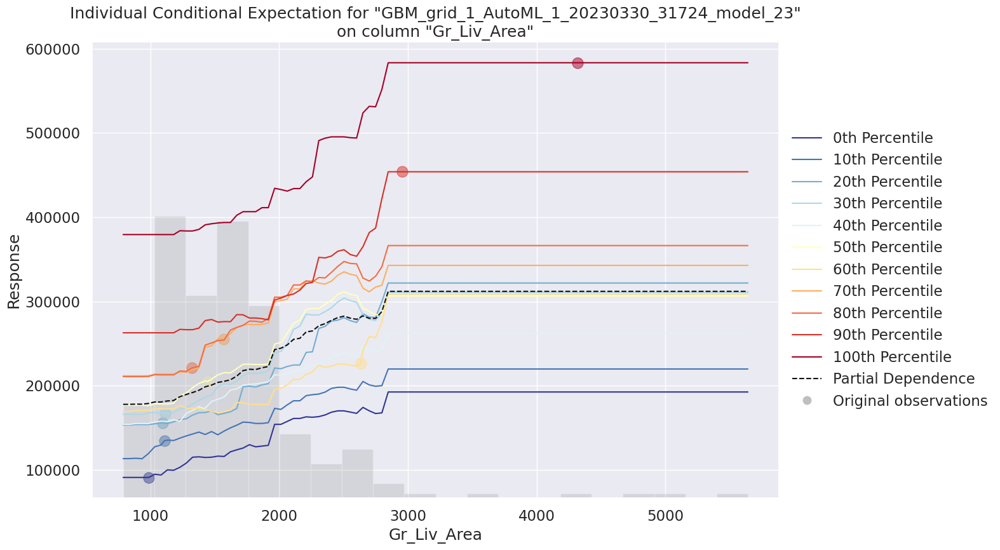

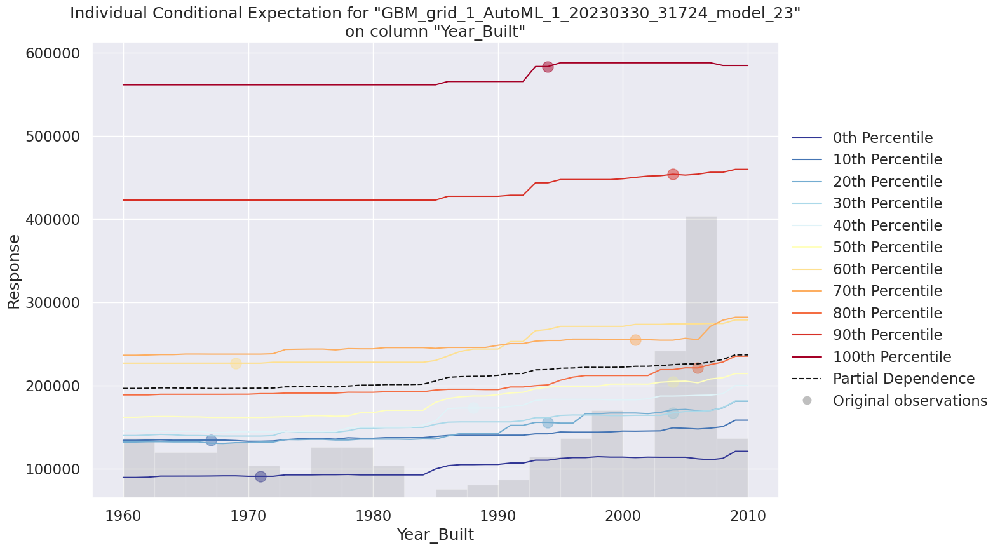

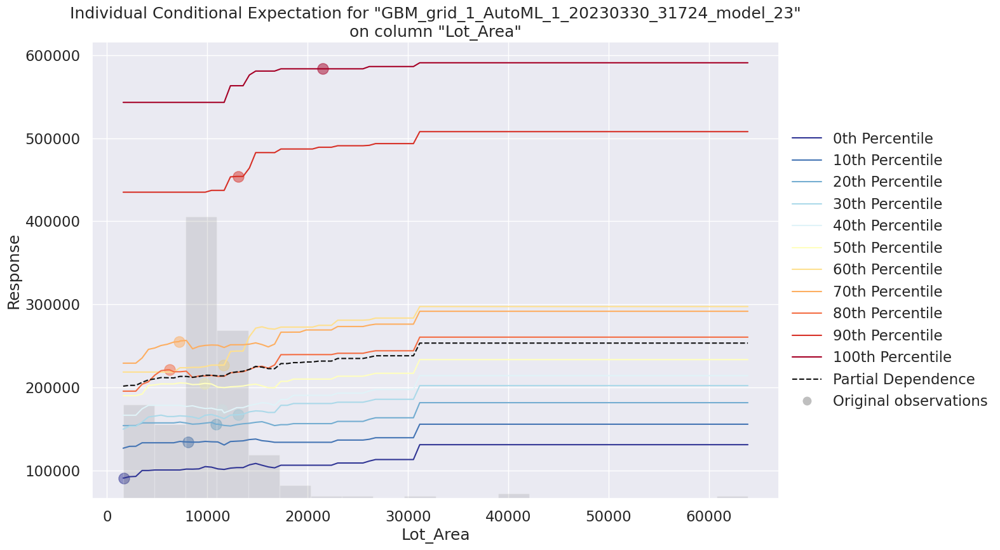

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [88]:
autoML_model.explain(autoML[1])  # AutoML Explainability

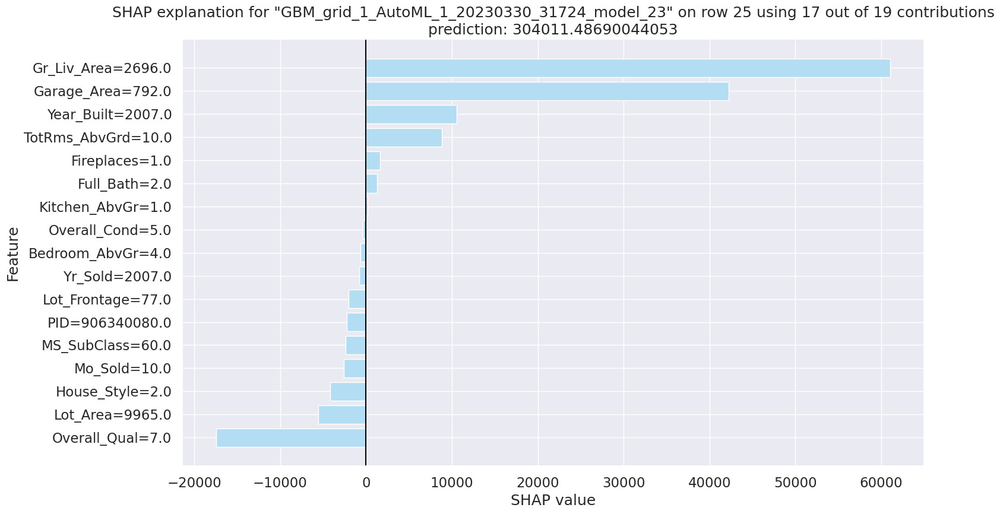

In [89]:
autoML_model.shap_explain_row_plot(
    autoML[1], 25
)  # Lets Analyze the 25th row in Test Data

**Interpreting Best Model from AutoML**

**Residual Analysis**

-If our plot has a random scattering of points, like in the graph above, it tells us that a linear model is a good choice for the data

**Variable Importance**

-In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above. The variable importance has been scaled between 0 to 1 for ease of understanding

**SHAP Summary**

From the SHAP summary diagram, we can interpret a few conclusions -

1.All the features are listed as per their importance in making the prediction, that is Overall_Qual is more significant followed by Gr_Liv_Area, and so on

2.The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is. As we can see Overall_Qual has the most impact on the SalePrice of our house. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result. As we can see the distribution of red points in the Overall_Qual feature is far more spread than the blue points. From this visual, we can interpret that the SalePrice increases as the Overall_Qual increases. It doesn't have much impact if the content is low i.e. between the shap value of 0.4 to 0.6 the blue data points are pretty concentrated. 

-The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables

**Partial Dependence Plot (PDP)**

A partial dependence plot shows the marginal effect of a feature on the target(SalePrice in our dataset). It is achieved by keeping all other variables constant and changing the value of one variable to get its PDP.

For Interpretation purposes, let us pick up the two most important variables - Overall_Qual and Gr_Liv_Area.

As we can see that when the rest of the variables are kept constant and a
marginal change is made in Overall_Quall, we can see the mean response increases between overall_quall levels of 6 to 9. This could be interpreted as this range of Overall_Quall could be the deciding factor in the SalePrice of House.

 2. Similarly when the rest of the variables are kept constant and a marginal change is made in Gr_Live_Area we can observe the mean response of feature is changing but is linear which means as the gr_liv_area for a house changes the saleprice changes, which makes sense more the area more will be the housing price less the area low will be the sales price. Hence, it can be interpreted that this feature is deciding factor in the SalePrice of our house.

 The computation of partial dependence plots is intuitive: The partial dependence function at a particular feature value represents the average prediction if we force all data points to assume that feature value.

** ICE (Individual Conditional Expectation) Plot**


ICE plot is similar to what we did in the PDP plot, but the fundamental difference between the two methods is that the PDP plot focuses on the average effect of a feature and does not focus on a specific instance. ICE plot comes in rescue to address this drawback of the PDP plot where the outputs from all instances are considered instead of an average value.

Let us go back to the Overall_Qual and Gr_Liv_Area features, as we interpreted in PDP the SalePrice increases when Overall_Quall and Gr_Liv_Area value is between 6 to 9. But is this true for every house in the dataset? ICE plot has an answer to this question. As we can see in the ICE plot (0th percentile instance) increases  in this range while the a few doesn't change much(100th Percentile Instance) for overall_quall.

Individual conditional expectation curves are even more intuitive to understand than partial dependence plots. One line represents the predictions for one instance if we vary the feature of interest.



**SHAP Analysis for Linear and Tree-Based Model**

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of Lot_Area

For the linear model the cross is made at approx E[f(x)] 208500


For Tree-based model the cross is made at approx E[f(x)] 211000


So as the Lot_Area increases the expected value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. 

By plotting this we can see the difference between the model output from the expected value.

Permutation explainer: 1216it [01:06, 15.23it/s]


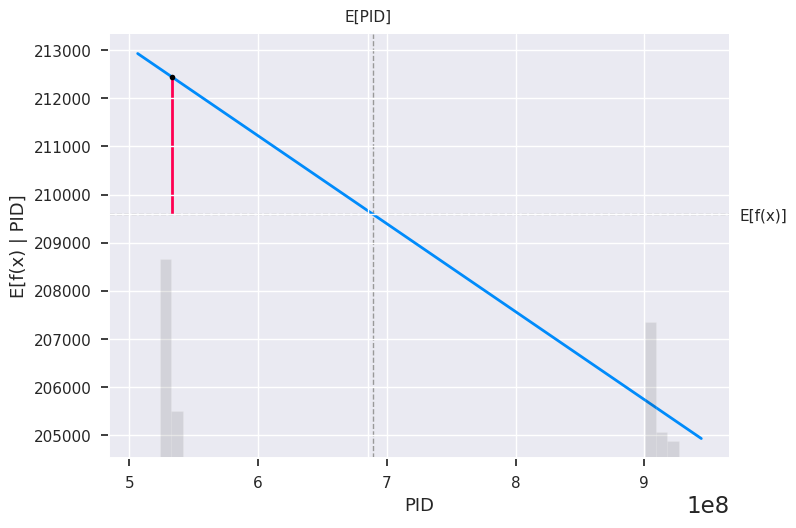

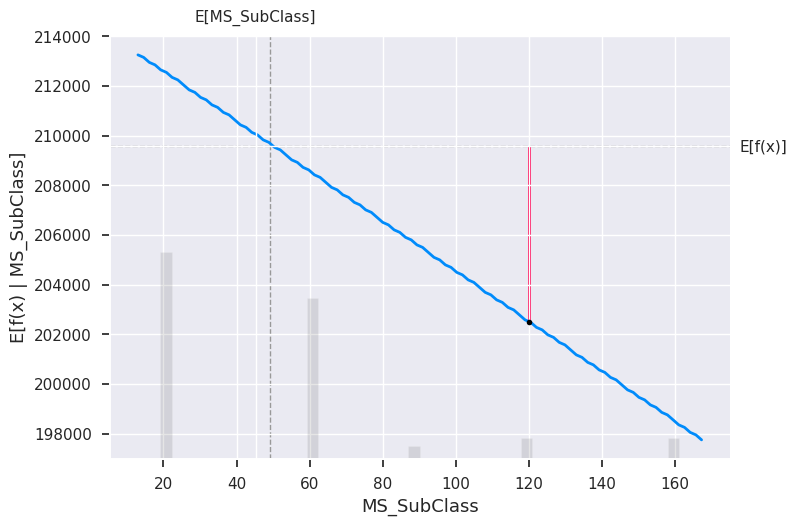

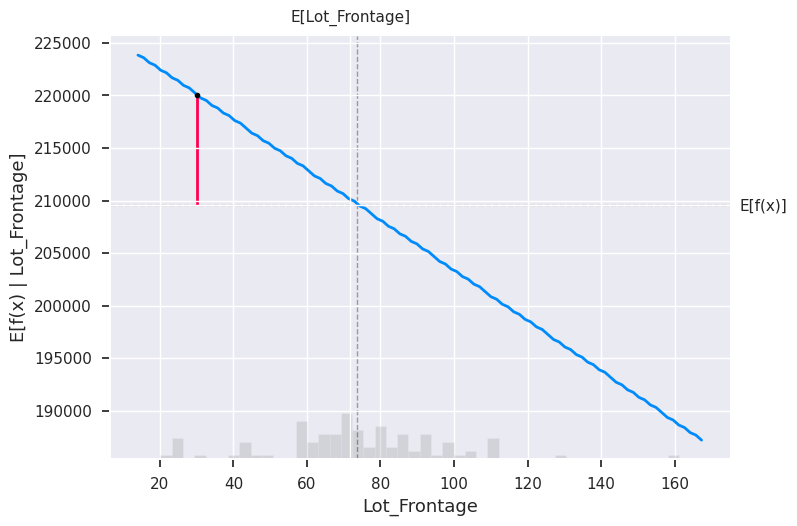

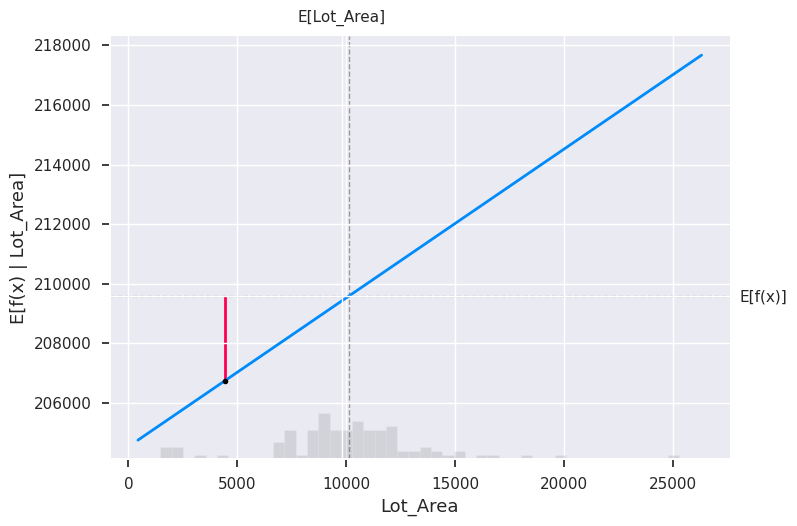

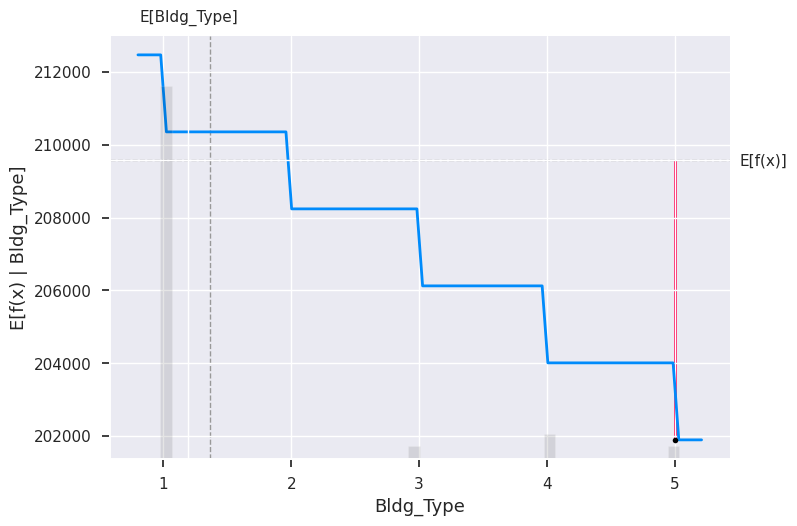

...

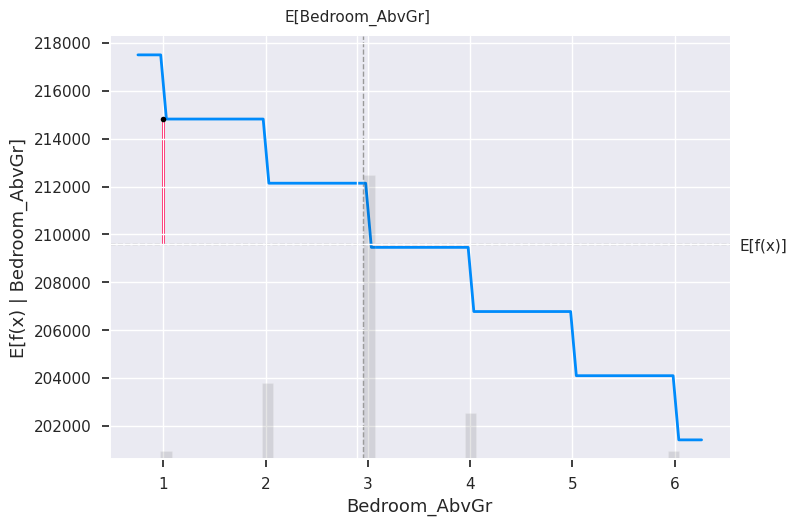

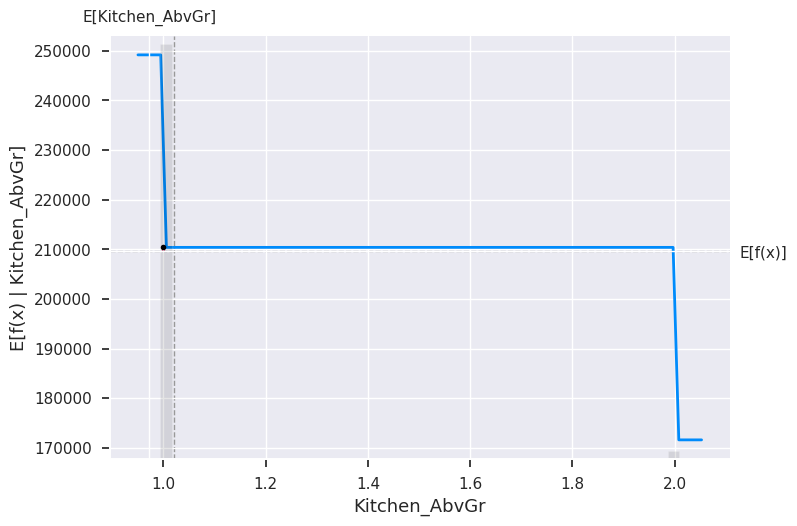

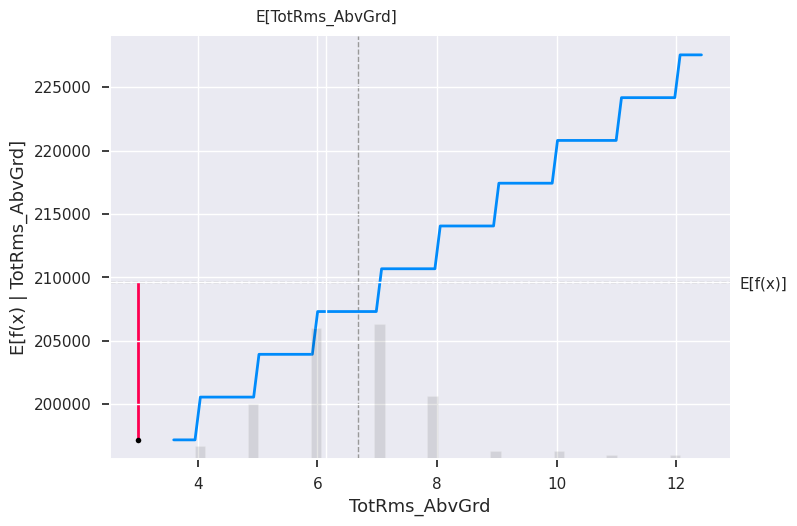

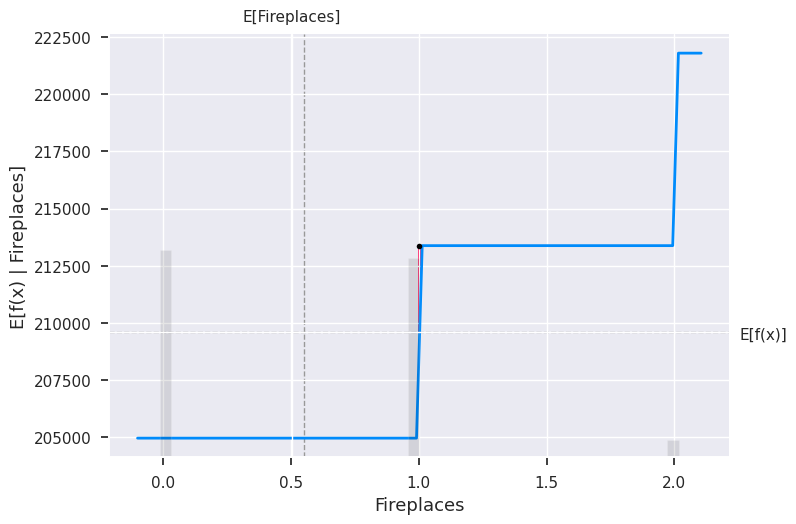

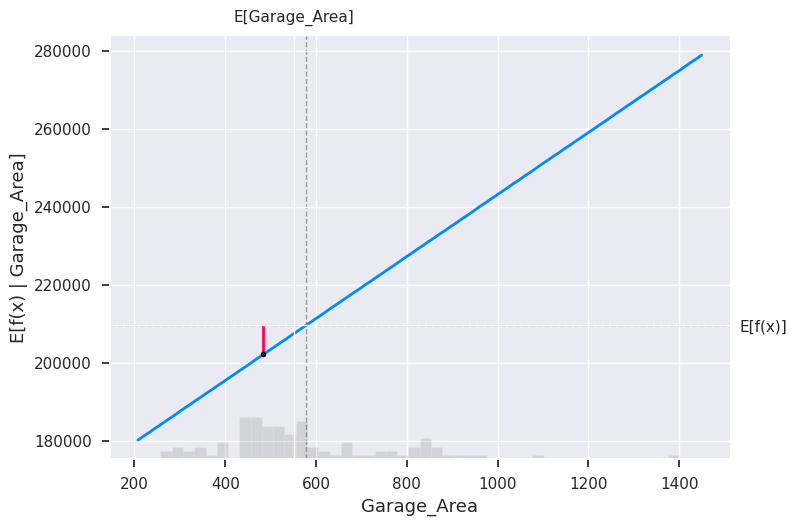

In [90]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

Permutation explainer: 1216it [01:24, 12.52it/s]                          


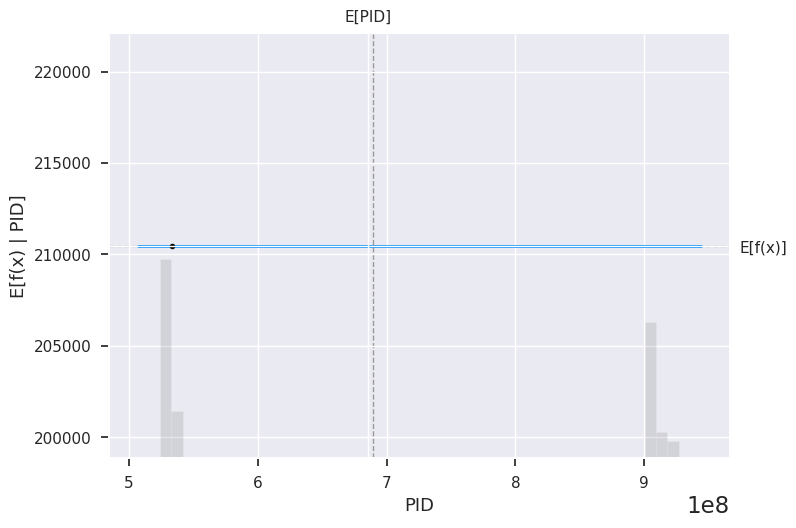

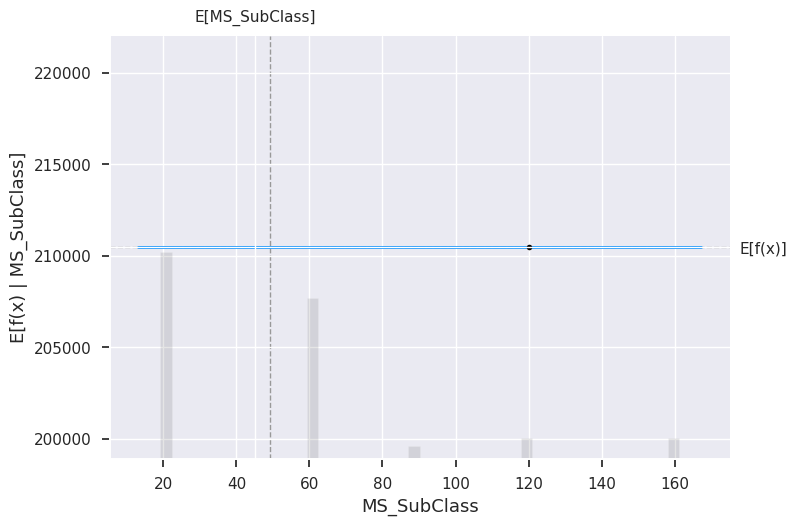

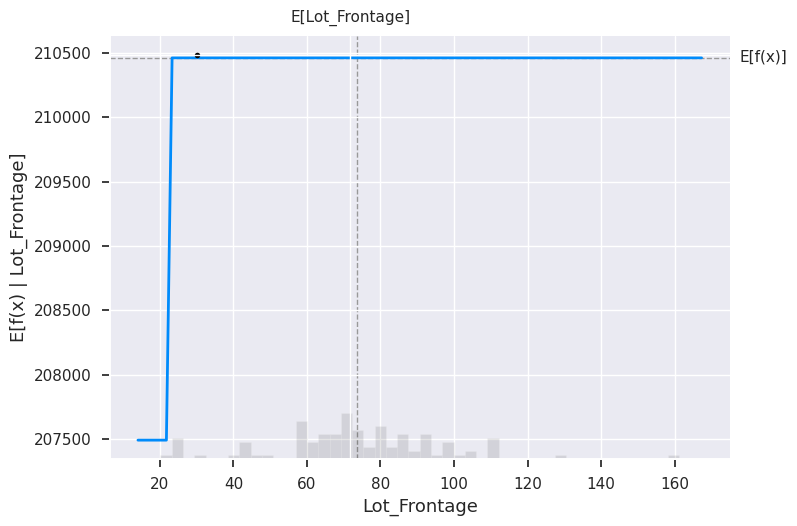

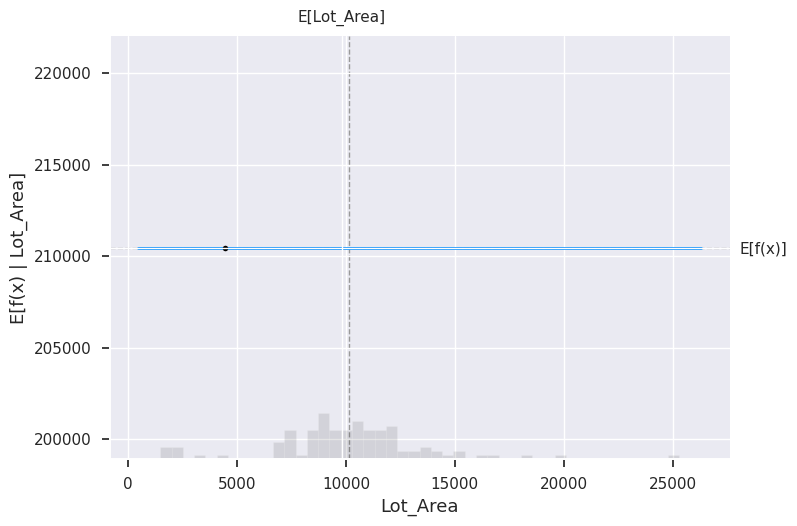

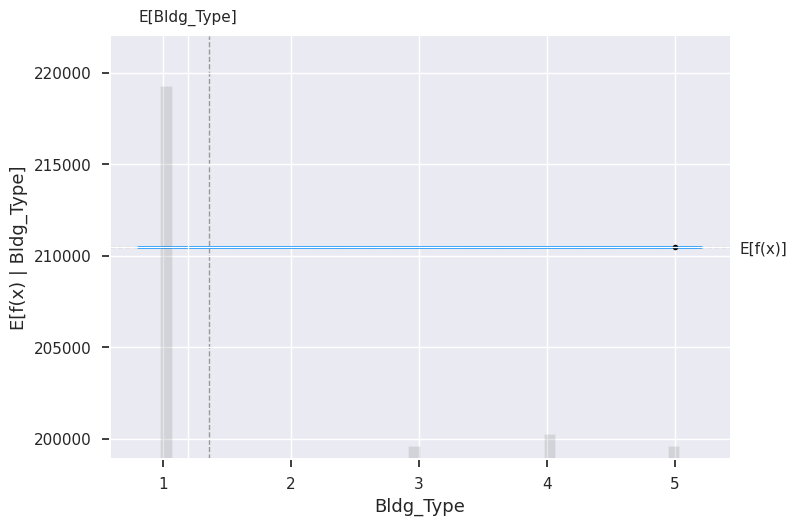

...

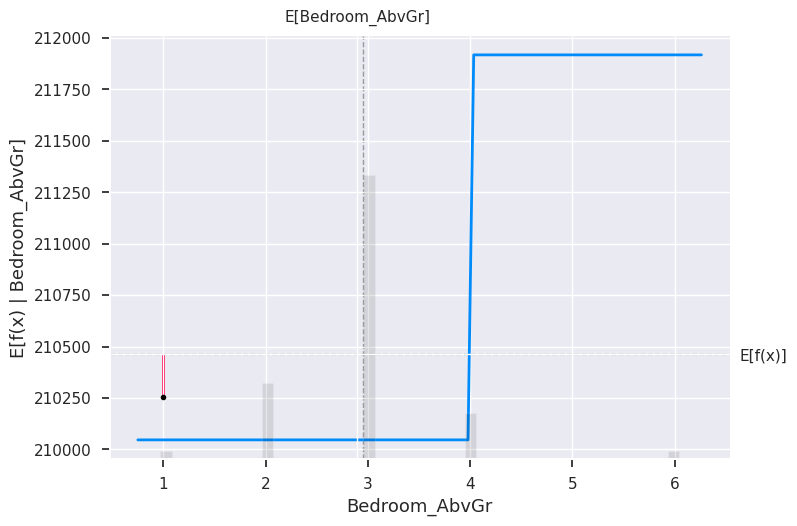

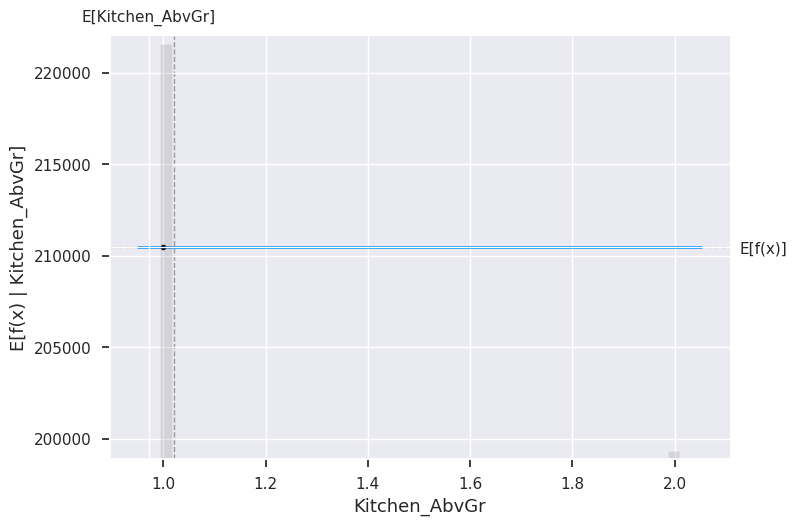

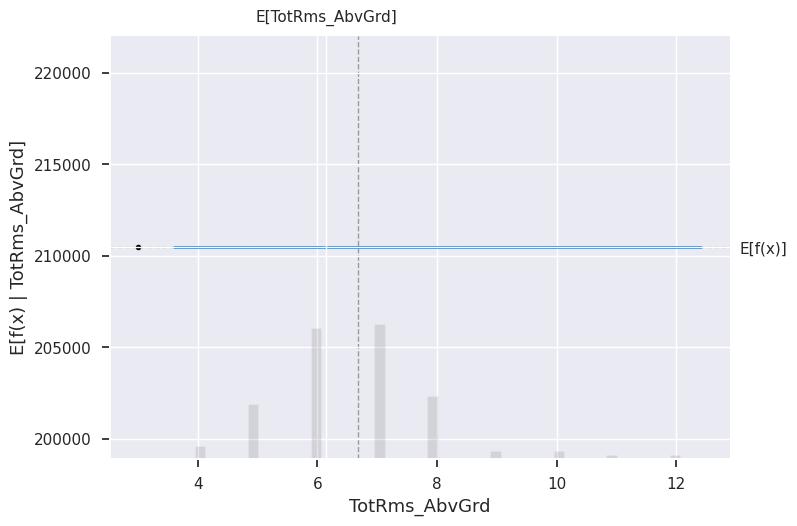

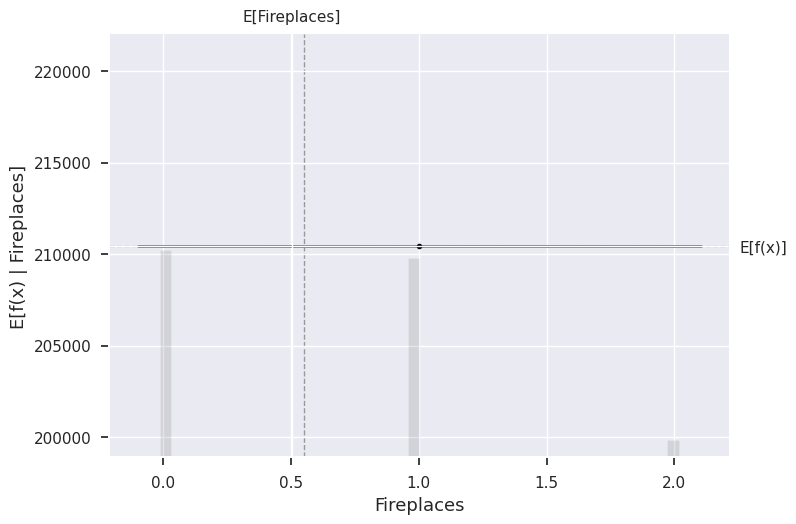

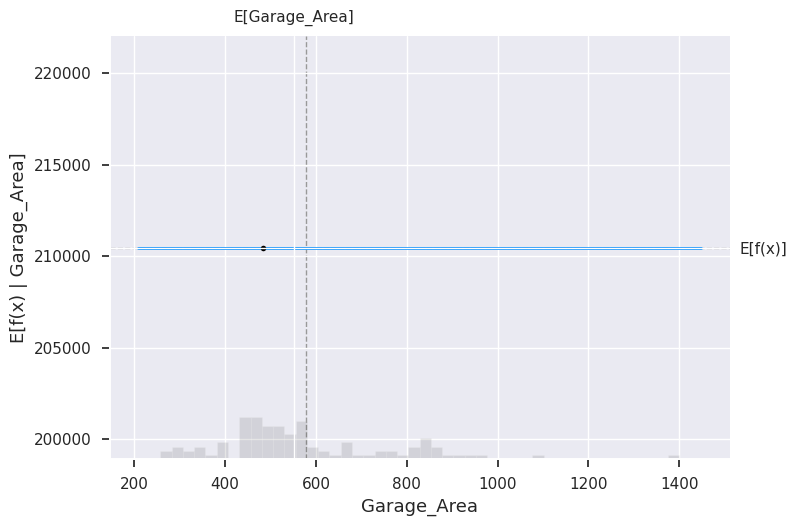

In [91]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

**Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**

The idea behind SHAP feature importance is simple:

 Features with large absolute Shapley values are important.
 
 Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

1.SHAP feature importance for a linear model 

2.SHAP feature importance for tree-based model






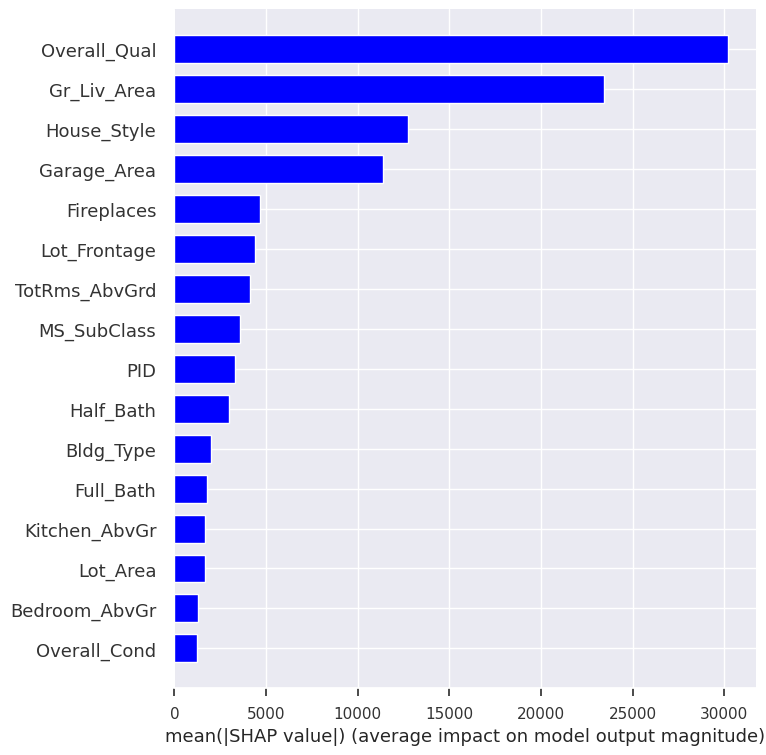

In [92]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

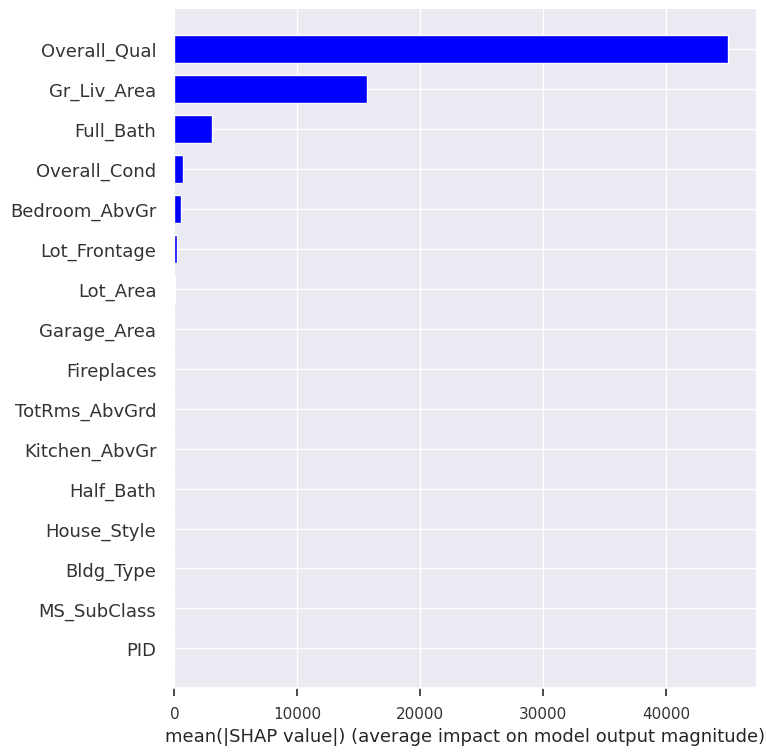

In [93]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="blue")

**Interpreting Waterfall SHAP visualization**


Let's consider the same sample (sample_ind = 18)


Notice the value of Lot_Area  in the waterfall model is different as what we have in SHAP partial dependence plot. 

It says that f(x) = 186652.403 is what we got as a model output and the expected output for this sample was 209594.935. Which almost has a difference ofn 22,942. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that Overall_quall has the biggest and most positive impact in increasing the SalePrice of house by 36213.1 for this specific sample. n. Using this model we can visually interpret why exactly this specific sample is giving the ouput


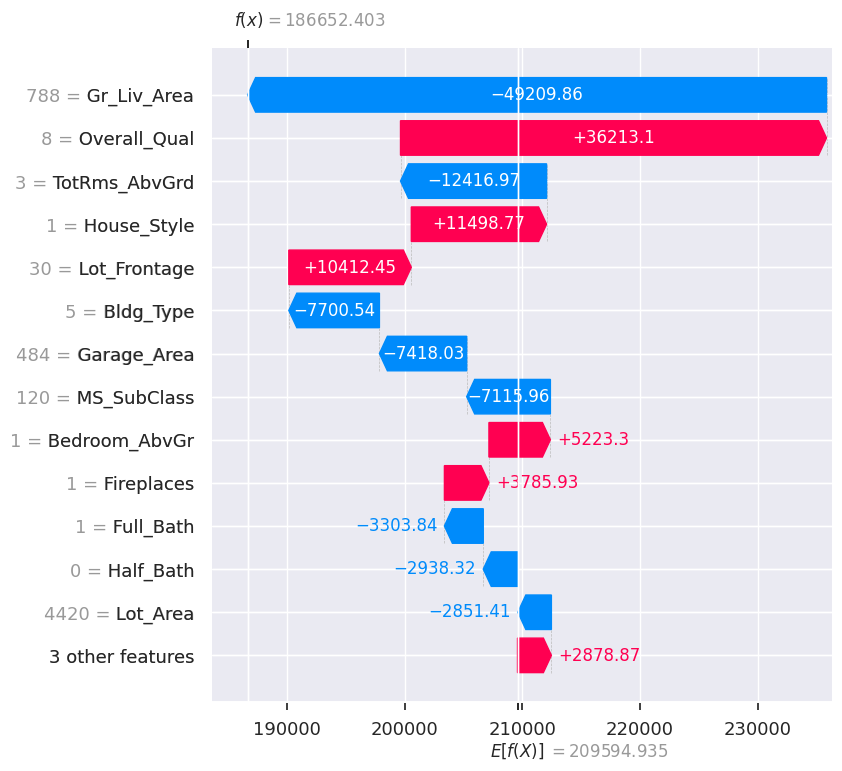

In [94]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

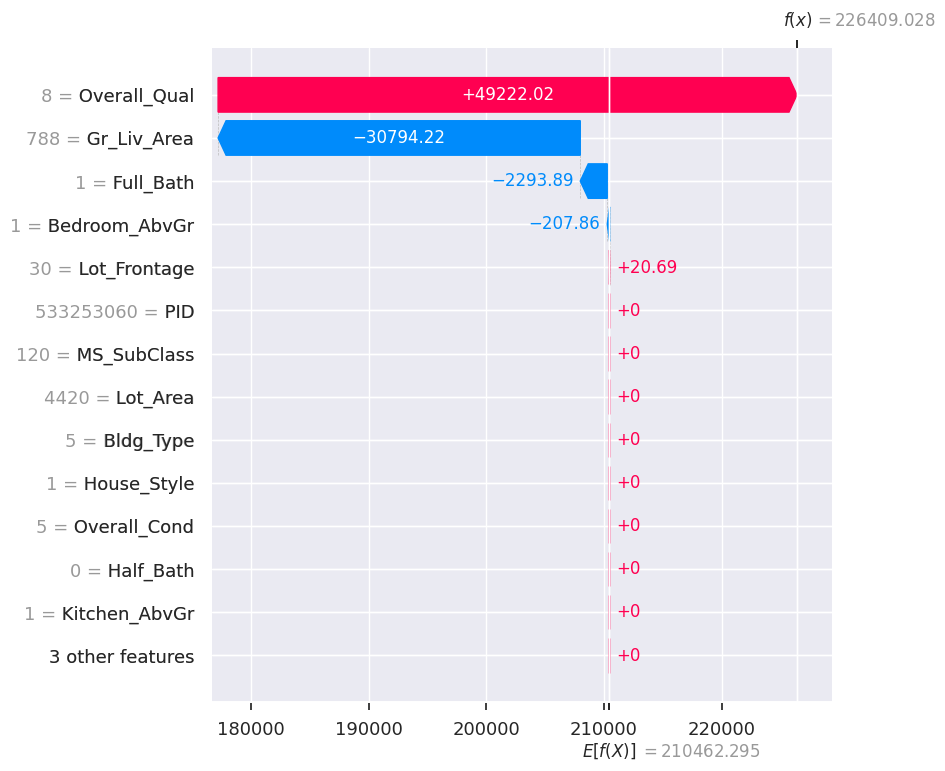

In [95]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

**Interpret the summary plot for the Linear and Tree-based model**


Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

Each dot(both red and blue) represents a feature of a House.

Red color represents high values whereas blue color represents low value


If a dot is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact


The position of a dot on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.

Let us try to understand how both models are performing side by side

Higher value of Overall_Qual tends to have a positive impact on the SalePrice of the house

Lower values of Gr_Liv_Area tend to have a positive impact on the SalePrice of the house.

Higher values of House_Style tends to have a positive impact on the SalePrice of the hpuse.

Lower value of garage_area tends to have a positive impact on the SalePrice of House, and so on.

This visualization is very useful when it comes to interpreting how our model is working.

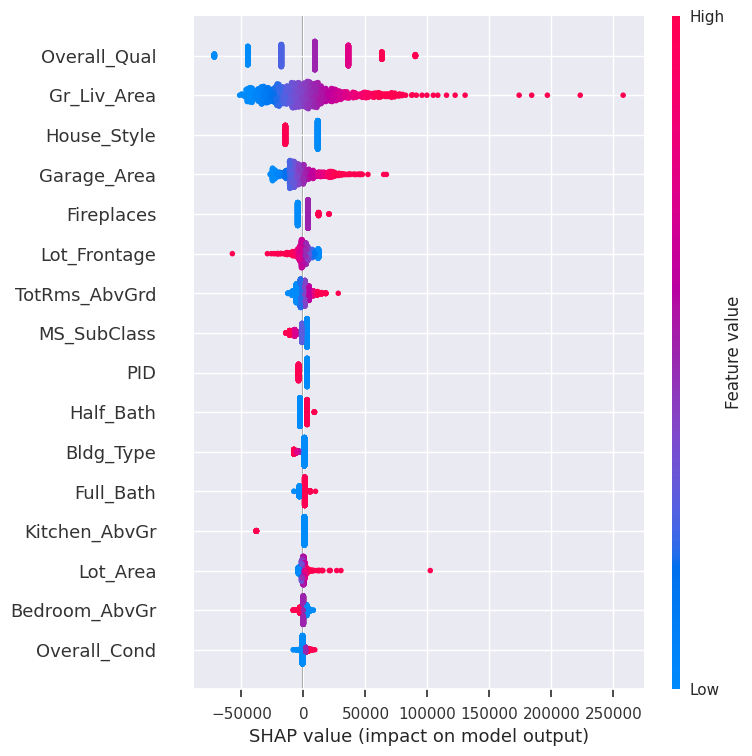

In [96]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

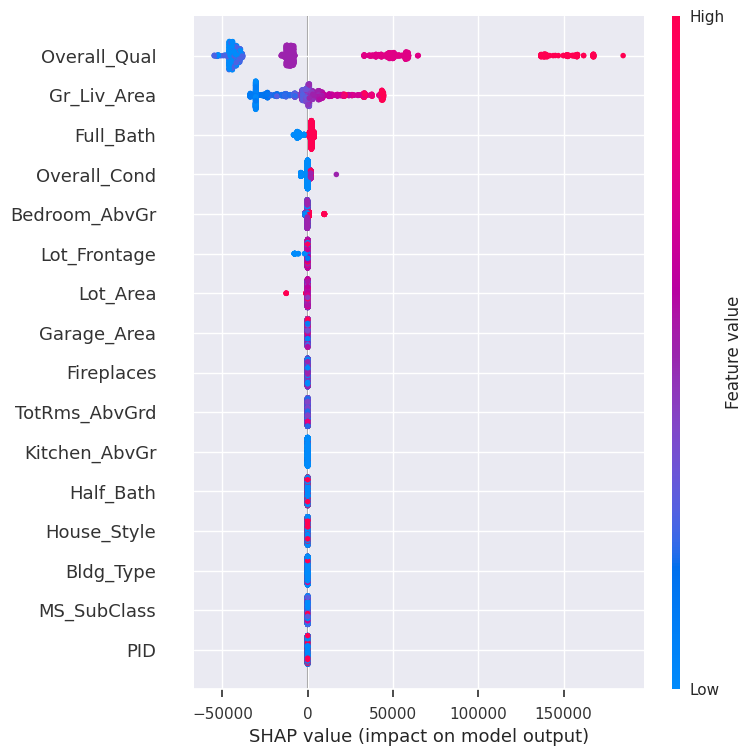

In [97]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)

**Interpreting SHAP dependence plot for Linear and Tree-based model**

The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every feature in our dataset.

As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the wine quality then the relationship will be directly proportional 



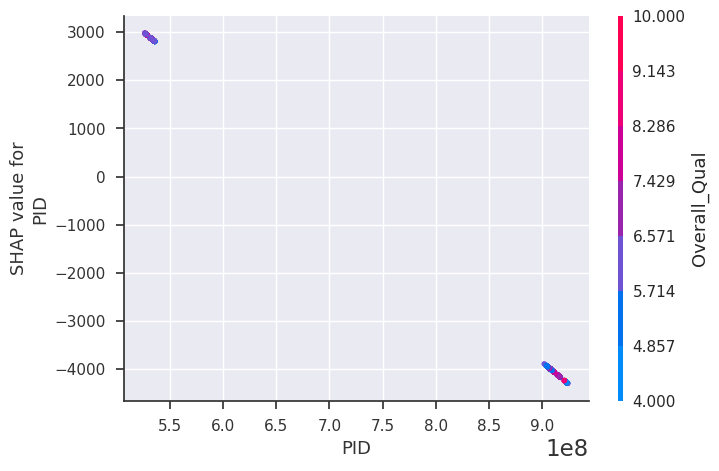

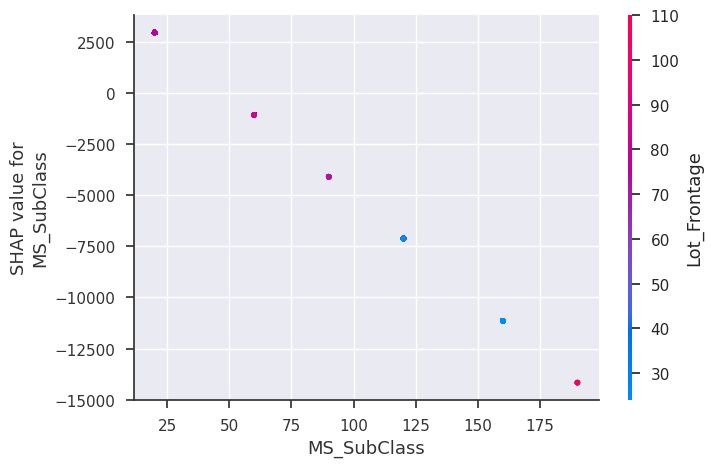

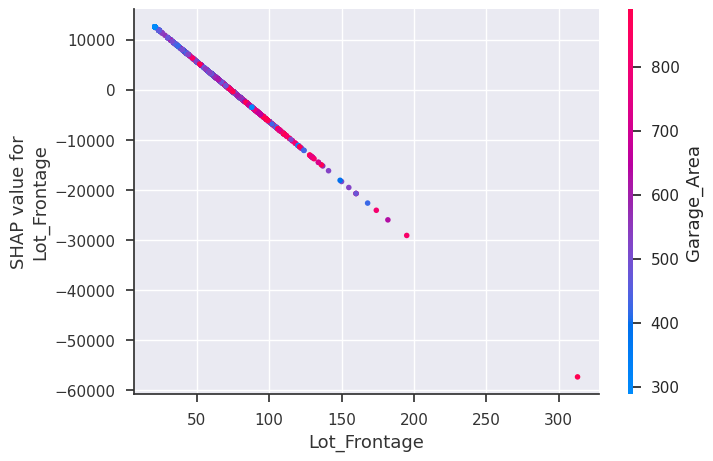

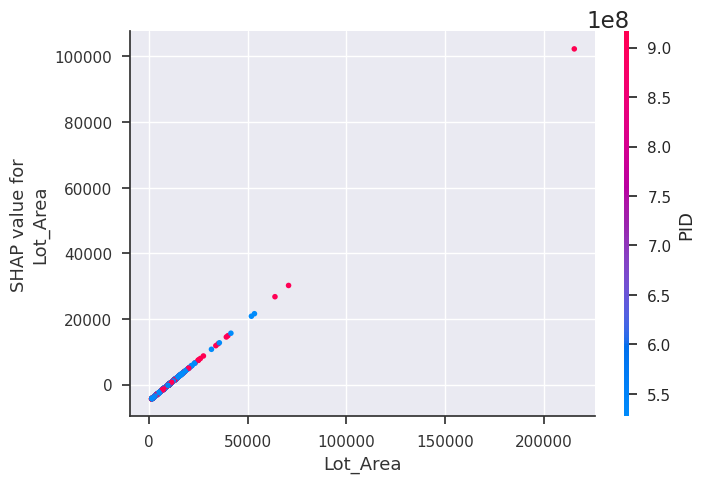

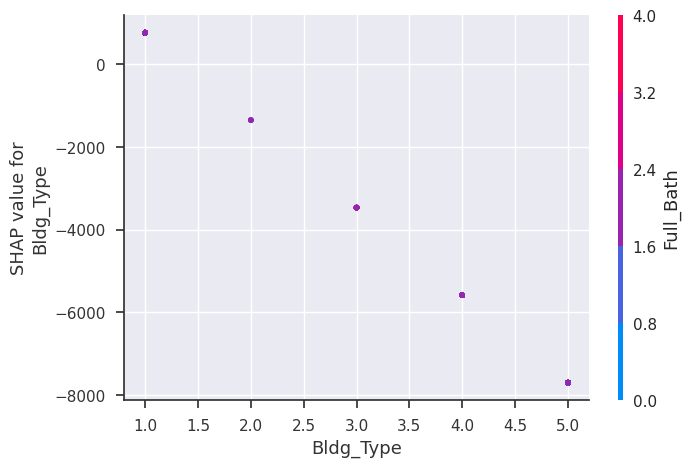

...

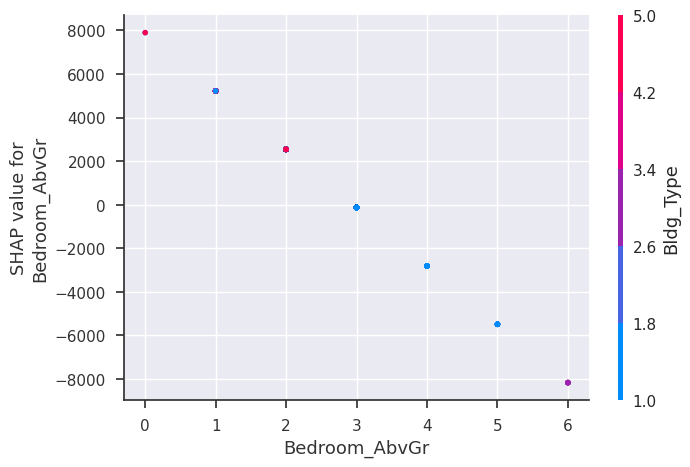

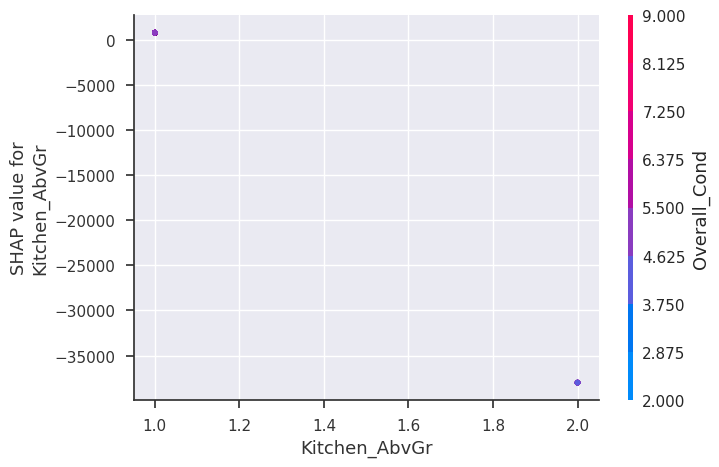

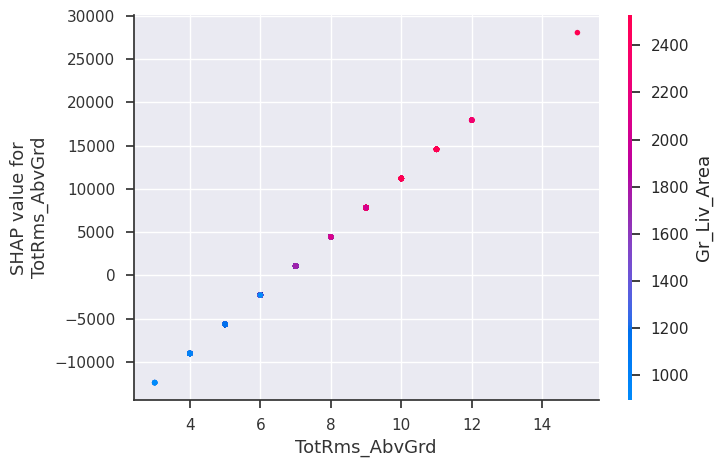

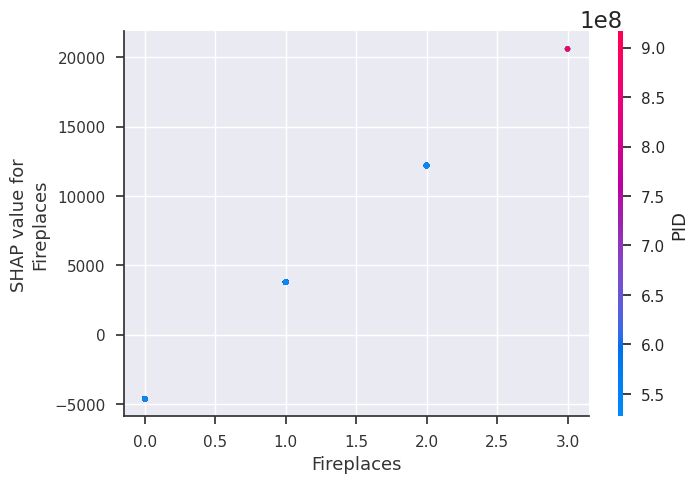

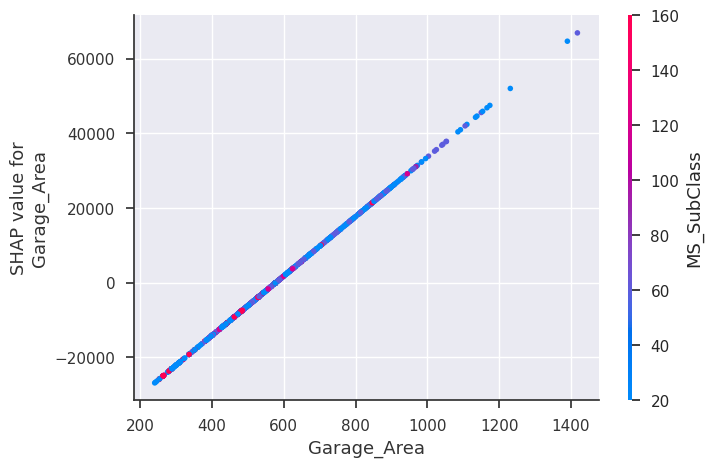

In [98]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

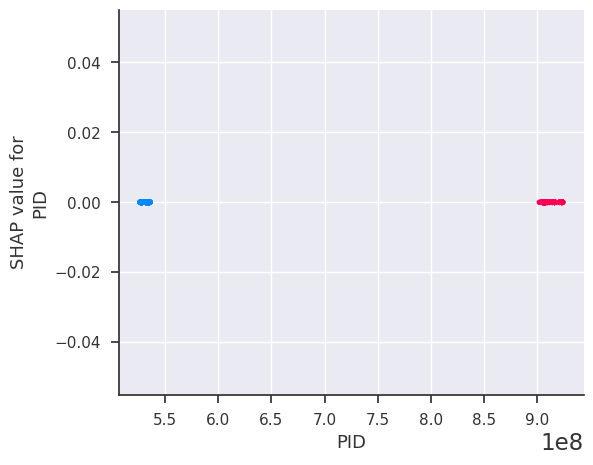

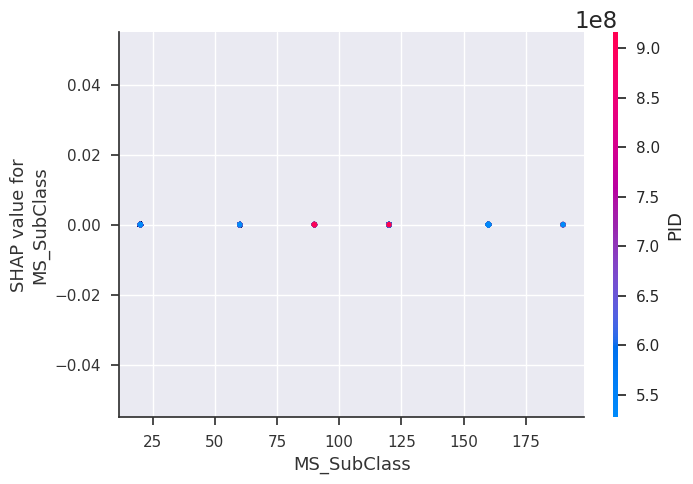

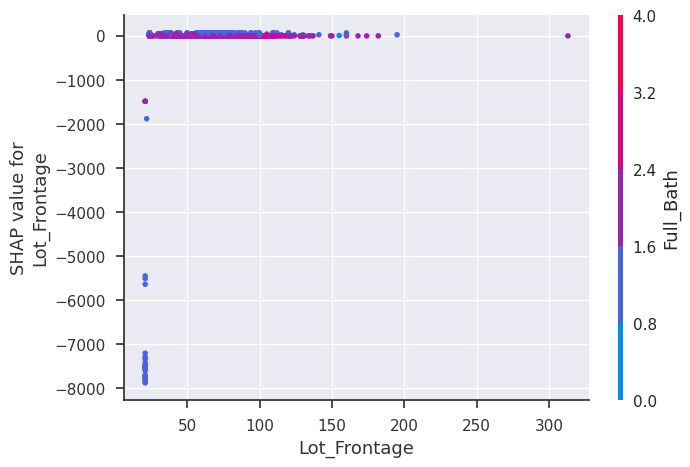

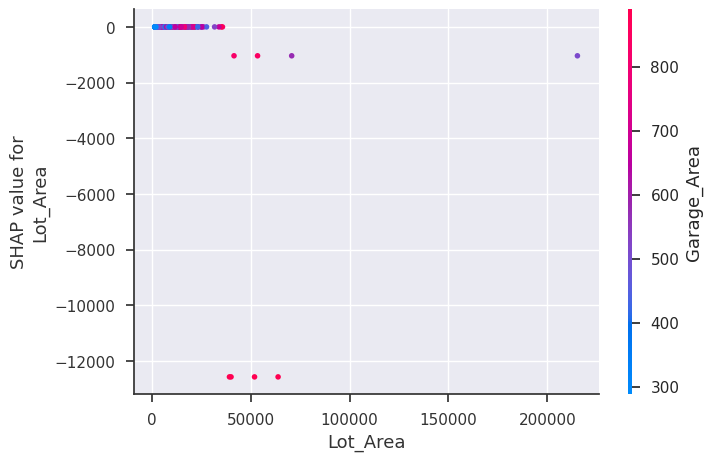

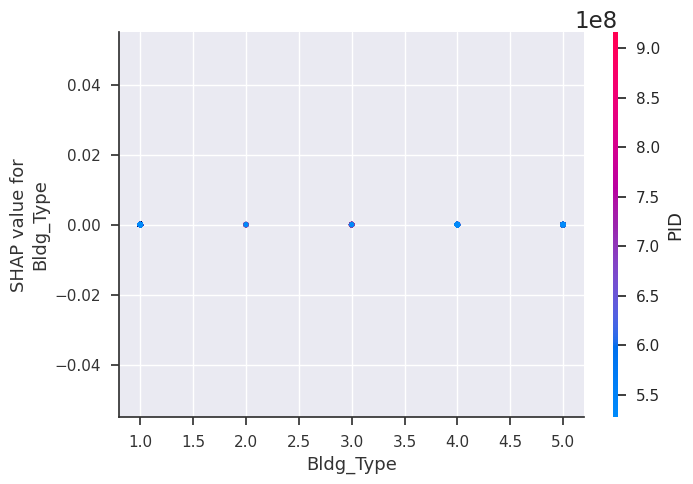

...

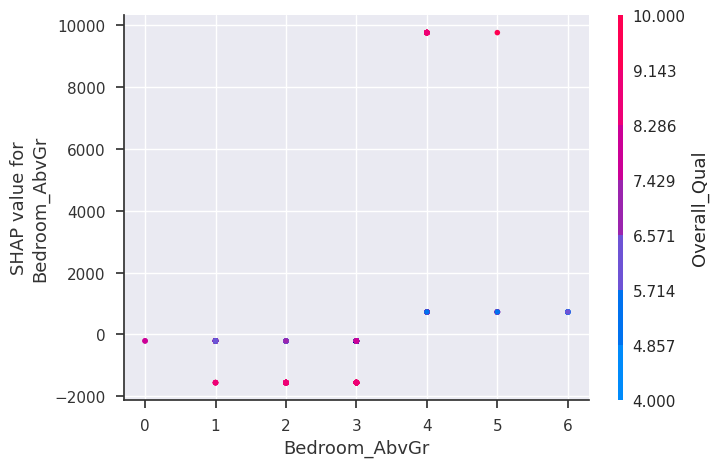

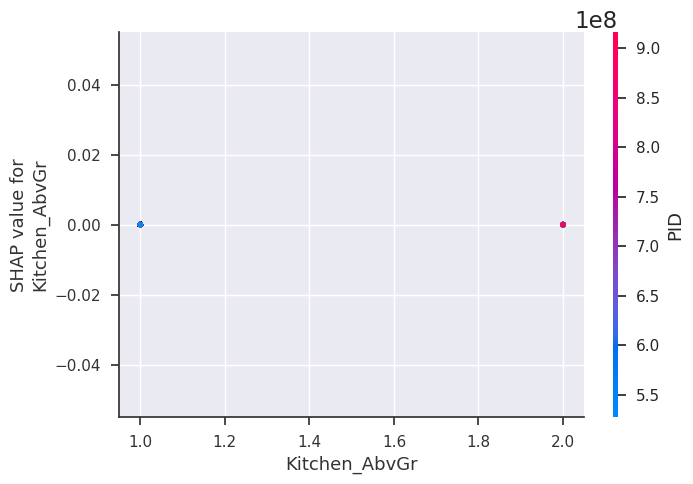

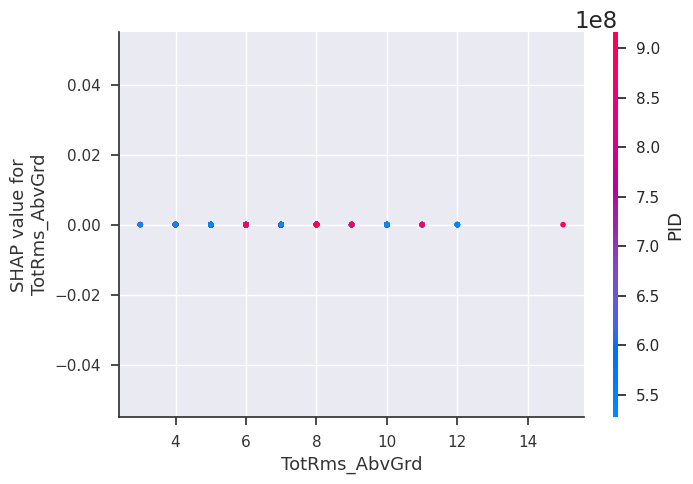

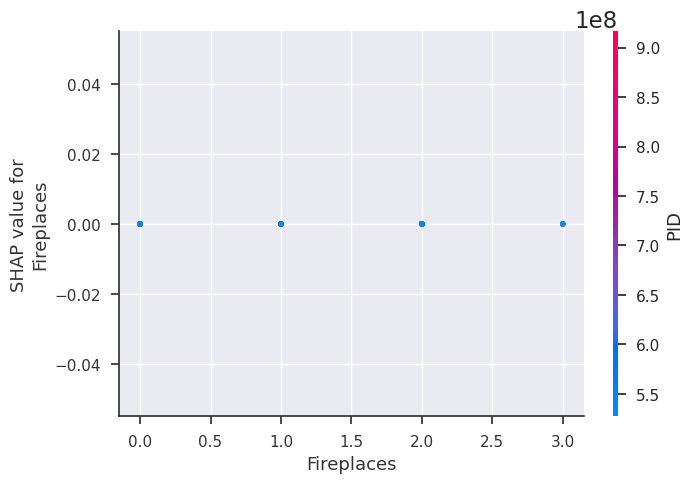

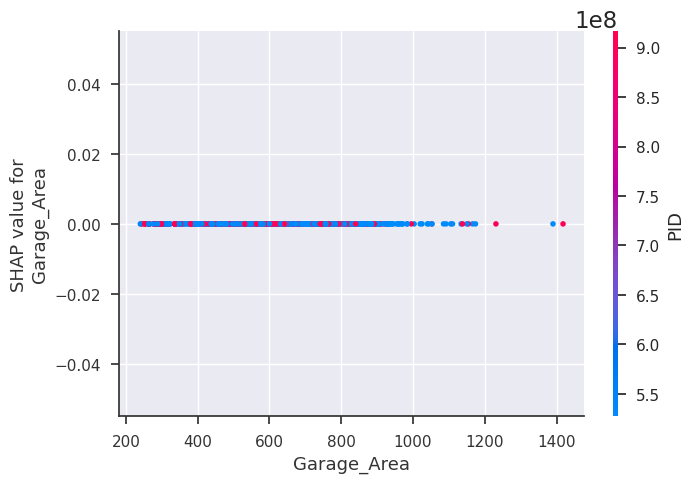

In [99]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

In [100]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

In [101]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p


**Force Plot SHAP analysis**

In [102]:
shap.initjs()  # Initializing JavaScript module
print(shap_plot_tree(18))  # SHAP force plot for sample 18

**Heatmap Visualization for Linear and Tree-based model**

This visualization is a summarization of the entire dataset on how each data point in every feature is affecting the target(SalePrice).

-Here the Y-axis is Features
and X-axis is Instance of that feature

-The color of the instance defines if it had a positive effect or negative effect by its color. If the instance is red then it had a positive effect and if the instance is blue then it had a negative effect

-The intensity of the color is directly proportional to the intensity of the effect. Deeper the color, the more impactful the feature is

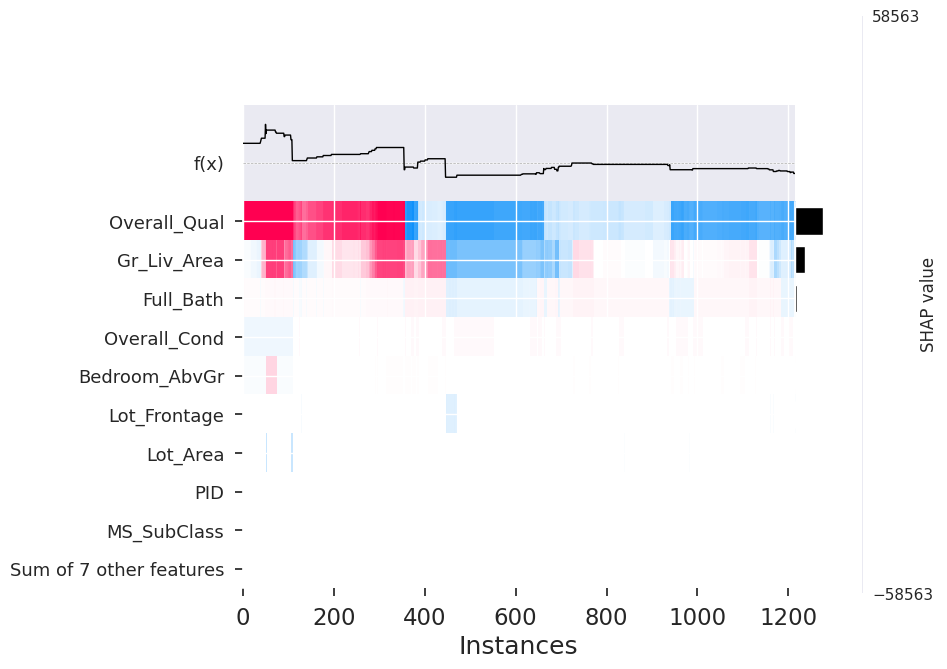

In [103]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

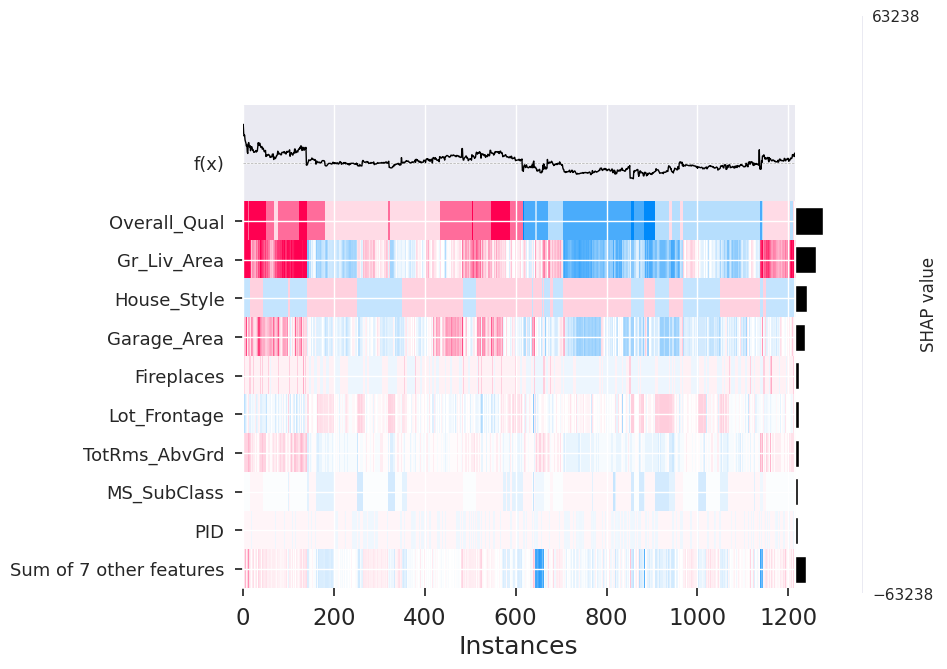

In [104]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

**LIME (Local Interpretation Model-Agnostic Explanation) Analysis**



LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model.

 LIME builds a local model in such a way that it can interpret the whole Black-Box

LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. 
Please refer below for Visualizations of both models

As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative

In [105]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [106]:
import lime
import lime.lime_tabular


In [107]:
lime_linear_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)


In [108]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [288072.7976251]
Actual :      242000


In [109]:
lime_linear_explanation.show_in_notebook()

**Tree Based Model**

In [110]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [111]:
import lime
import lime.lime_tabular


In [112]:
import lime
import lime.lime_tabular


In [113]:
lime_tree_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)


In [114]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [239000.43968485]
Actual :      242000


In [115]:
lime_tree_explanation.show_in_notebook()

**Comparision between SHAP, LIME**

Unlike LIME, SHAP does not necessarily build a local interpretable model 

but rather uses the black-box model to calculate the marginal contribution

 to the prediction for each feature and then relies on the theoretically 
 
 sound game theory concept of Shapley values to calculate the feature importance. 
 
 In this way, SHAP improves upon LIME due to its greater stability and lack of local linear model assumptions.

 SHAP gives how much each variable contributes to the prediction


LIME is more like SHAP but a lite version of it - It takes the local 

region of the point of interest and gives us information about the contribution each variable has made to the output


We have to analyze our needs and then consider the tradeoff to select the best suitable interpretable method for the ML model

**References**


Molnar, C. (2022). Interpretable Machine Learning: A Guide for Making Black Box Models Explainable (2nd ed.)
christophm.github.io/interpretable-ml-book/

https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
https://medium.com/@kalia_65609/interpreting-an-nlp-model-with-lime-and-shap-834ccfa124e4#:~:text=Unlike%20LIME%2C%20SHAP%20does%20not,to%20calculate%20the%20feature%20importance.

and Professor's sample notebook.
